# Studium przypadku - Stellar Classification Dataset

Autor: `Joanna Adamczyk`

## Zbiór danych

Źródło: https://www.kaggle.com/datasets/fedesoriano/stellar-classification-dataset-sdss17?resource=download



### Kontekst

Powyższy zbiór danych ma na celu klasyfikację gwiazd, galaktyk i kwazarów na podstawie ich charakterystyk spektralnych.

`Gwiazda` - kuliste ciało niebieskie, stanowiące skupisko powiązanej grawitacyjnie materii. Przynajmniej przez część swojego istnienia emituje w sposób stabilny promieniowanie elektromagnetyczne (w szczególności światło widzialne). Gwiazdy powstają głównie z wodoru i helu, lecz w trakcie życia przybywa w nich atomów cięższych pierwiastków (tzw. metali).

`Galaktyka` (z gr. γάλα, gála – mleko) – duży, grawitacyjnie związany układ gwiazd, pyłu i gazu międzygwiazdowego oraz niewidocznej ciemnej materii. Typowa galaktyka zawiera od $10^{7}$ do $10^{12}$ gwiazd orbitujących wokół wspólnego środka masy.
 
`Kwazar` (z ang. quasar – quasi-stellar radio source lub też QSO – quasi-stellar object, dosłownie „obiekt gwiazdopodobny emitujący fale radiowe”) – zwarte źródło ciągłego promieniowania elektromagnetycznego o ogromnej mocy, pozornie przypominające gwiazdę. W rzeczywistości jest to rodzaj aktywnej galaktyki. 

### Opis zbioru danych

Zbiór danych zawiera 100 000 obserwacji z kosmosu wykonanych przez SDD (sloan Digital Sky Survey). Każda obserwacja jest opisana przy pomocy 17 atrybutów i jednej klasy decyzyjnej, która definiuje, czy obiekt jest gwiazdą, galaktyką, czy kwazarem.

#### Opis atrybutów

`obj_ID` $\rightarrow$ Unikalna wartość identyfikująca obiekt w katalogu obrazów używanym przez CAS (Centre for Astrophysics and Supercomputing)

`run_ID` $\rightarrow$ Numer uruchomienia używany do identyfikacji konkretnego skanu

`rereun_ID` $\rightarrow$ Powtórz numer, aby określić sposób przetwarzania obrazu

`cam_col` $\rightarrow$ Kolumna kamery do identyfikacji linii skanowania w przebiegu

`field_ID` $\rightarrow$ Numer pola do identyfikacji każdego pola

`spec_obj_ID` $\rightarrow$ Unikalny identyfikator używany dla optycznych obiektów spektroskopowych (oznacza to, że 2 różne obserwacje o tym samym spec_obj_ID muszą dzielić klasę wyjściową)

`alpha` $\rightarrow$ Kąt rektascensji (w epoce J2000)

`delta` $\rightarrow$ Kąt deklinacji (w epoce J2000)

`u` $\rightarrow$ Filtr ultrafioletowy (ultraviolet) w systemie fotometrycznym

`g` $\rightarrow$ Filtr zielony (green) w systemie fotometrycznym

`r` $\rightarrow$ Filtr czerwony (red) w systemie fotometrycznym

`i` $\rightarrow$ Filtr bliskiej podczerwieni (infrared) w systemie fotometrycznym

`z` $\rightarrow$ Filtr podczerwieni w systemie fotometrycznym

`redshift` $\rightarrow$ Wartość przesunięcia ku czerwieni na podstawie wzrostu długości fali

`plate` $\rightarrow$ identyfikator płyty, identyfikuje każdą płytkę w SDSS (blaszki w teleskopie z wywierconymi otworami, które pozwalają na obserwację wielu obiektów jednocześnie)

`MJD` $\rightarrow$ Zmodyfikowana data juliańska, używana do wskazania, kiedy dany fragment danych SDSS został pobrany (liczba całkowita oznaczająca zmodyfikowaną datę juliańską nocy, w której przeprowadzono obserwację. Niektóre płyty zaobserwowano więcej niż jeden raz; te różne obserwacje będą miały różne wartości MJD)

`fiber_ID` $\rightarrow$ ID włókna, które identyfikuje włókno, które w każdej obserwacji skierowało światło na płaszczyznę ogniskowania

`class` $\rightarrow$ Klasa obiektu (galaktyka, gwiazda lub kwazar)

#### Dodatkowe objaśnienia terminów

`System fotometryczny` w astronomii to zestaw dobrze zdefiniowanych pasm przepustowych (lub filtrów optycznych) o znanej wrażliwości na promieniowanie padające. Czułość zwykle zależy od zastosowanego systemu optycznego, detektorów i filtrów. Dla każdego systemu fotometrycznego dostarczany jest zestaw podstawowych gwiazd wzorcowych.

`Filtry w systemie fotometrycznym` to akcesorium do teleskopu składające się z filtra optycznego używanego przez astronomów amatorów w celu poprawienia szczegółów i kontrastu obiektów niebieskich, zarówno do oglądania, jak i do fotografowania. Z drugiej strony astronomowie badający używają różnych filtrów pasmowych do fotometrii w teleskopach, aby uzyskać pomiary, które ujawniają astrofizyczne właściwości obiektów, takie jak klasyfikacja gwiazd i położenie ciała niebieskiego na jego krzywej Wien.

`plate + MJD + fiber_ID` jednoznacznie określa pojedynczą obserwację pojedynczego obiektu.`

Bardziej obszerne objaśnienia atrybutów: https://www.sdss3.org/dr10/help/glossary.php#object






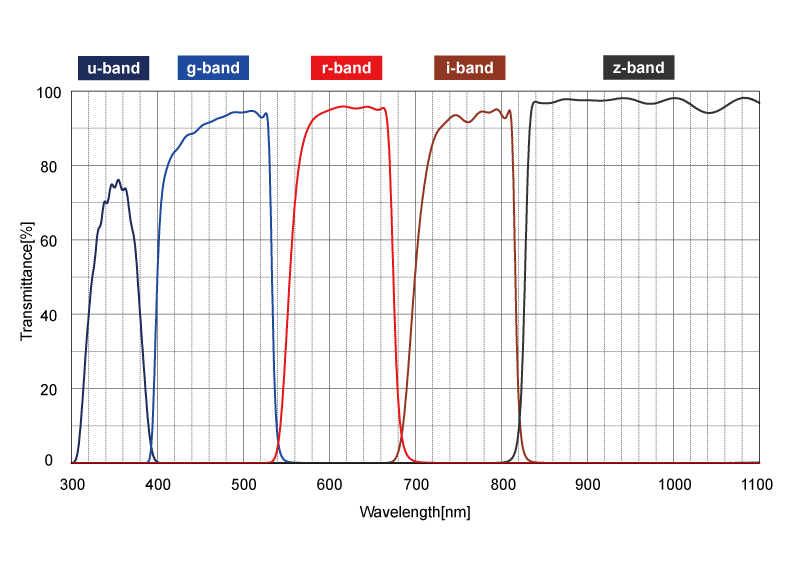

In [104]:
from IPython.display import Image

Image(filename='waves.jpg') 

## Wykorzystywane biblioteki

In [27]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import seaborn as sns
sns.set_style("whitegrid")

from matplotlib import pyplot as plt
plt.style.use('ggplot')

from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score

fold = StratifiedKFold(n_splits=4, shuffle = True, random_state=62)
# fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=2021)

from sklearn.metrics import accuracy_score, roc_auc_score, make_scorer, confusion_matrix
from imblearn.metrics import geometric_mean_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.pipeline import Pipeline

## Wstępna analiza danych

### Wczytanie danych

In [46]:
df = pd.read_csv("star_classification.csv", sep=",")
df

'''
# Zamiana etykiet klas ze stringów na liczbowe
le = LabelEncoder()
df["class"] = le.fit_transform(df["class"])
df["class"] = df["class"].astype(int)

print(list(le.inverse_transform([0, 1, 2])))
'''


,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

In [48]:
df.describe()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
count,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.0,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.237665e+18,177.629117,24.135305,21.980468,20.531387,19.645762,19.084854,18.668810,4481.366060,301.0,3.511610,186.130520,5.783882e+18,0.576661,5137.009660,55588.647500,449.312740
std,8.438560e+12,96.502241,19.644665,31.769291,31.750292,1.854760,1.757895,31.728152,1964.764593,0.0,1.586912,149.011073,3.324016e+18,0.730707,2952.303351,1808.484233,272.498404
min,1.237646e+18,0.005528,-18.785328,-9999.000000,-9999.000000,9.822070,9.469903,-9999.000000,109.000000,301.0,1.000000,11.000000,2.995191e+17,-0.009971,266.000000,51608.000000,1.000000
25%,1.237659e+18,127.518222,5.146771,20.352353,18.965230,18.135828,17.732285,17.460677,3187.000000,301.0,2.000000,82.000000,2.844138e+18,0.054517,2526.000000,54234.000000,221.000000
50%,1.237663e+18,180.900700,23.645922,22.179135,21.099835,20.125290,19.405145,19.004595,4188.000000,301.0,4.000000,146.000000,5.614883e+18,0.424173,4987.000000,55868.500000,433.000000
75%,1.237668e+18,233.895005,39.901550,23.687440,22.123767,21.044785,20.396495,19.921120,5326.000000,301.0,5.000000,241.000000,8.332144e+18,0.704154,7400.250000,56777.000000,645.000000
max,1.237681e+18,359.999810,83.000519,32.781390,31.602240,29.571860,32.141470,29.383740,8162.000000,301.0,6.000000,989.000000,1.412694e+19,7.011245,12547.000000,58932.000000,1000.000000


### Selekcja i analiza atrybutów


Do analizy niepotrzebne są napewno następujące atrybuty:
- `obj_ID` - identyfikator obiektu nie ma żadnego wpływu na klasyfikacje,
- `rerun_ID` - jest jedna unikalna wartość, więc nie poprawi to klasyfikacji.

W dalszej analizie sprawdzę, czy jeszcze jakieś atrybuty możemy odrzucić, te które w żaden sposób nie rozróżniają od siebie klas decyzyjnych.

Ze zbioru danych generuję dwa pozdbiory: X zawierający wszystkie atrybuty warunkowe oraz y zawierający klasę decyzyjną. Z uwagi na bardzo dużą rozbieżność wartości danych (bardzo duże wartości ujemne i dodatnie) rezygnuję z wizualizacji rozkładu atrybutów za pomoca wykresu boxplot.

In [49]:
df = df.drop(columns='obj_ID')
df = df.drop(columns='rerun_ID')
df

,alpha,delta,u,g,r,i,z,run_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


#### Analiza rozkładu gestości atrybutów

Dla każdej klasy jest analizowany rozkład wartości poszczególnego atrybutu.

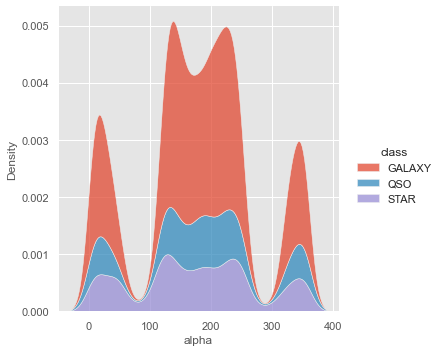

In [50]:
sns.displot(data=df, x='alpha', kind="kde", hue="class", multiple='stack')

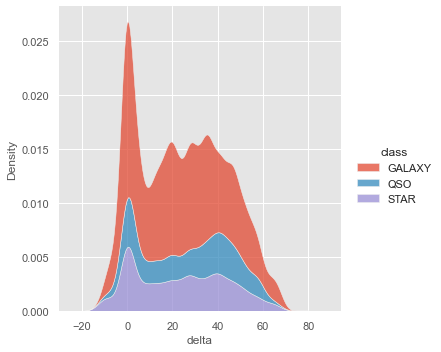

In [51]:
sns.displot(data=df, x='delta', kind="kde", hue="class",multiple='stack')


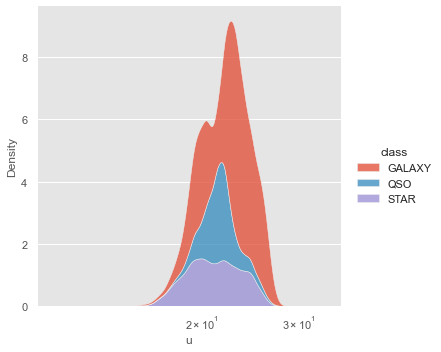

In [52]:
sns.displot(data=df, x='u', kind="kde", hue="class", log_scale=True, multiple='stack')


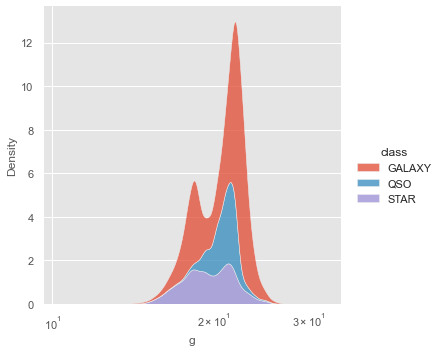

In [53]:
sns.displot(data=df, x='g', kind="kde", hue="class", log_scale=True, multiple='stack')


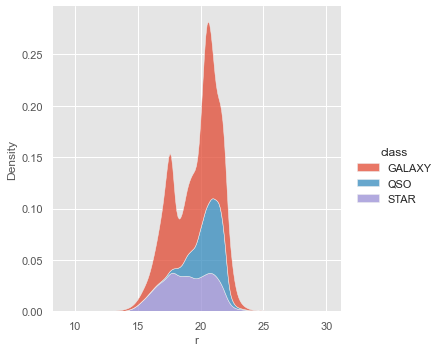

In [54]:
sns.displot(data=df, x='r', kind="kde", hue="class", multiple='stack')


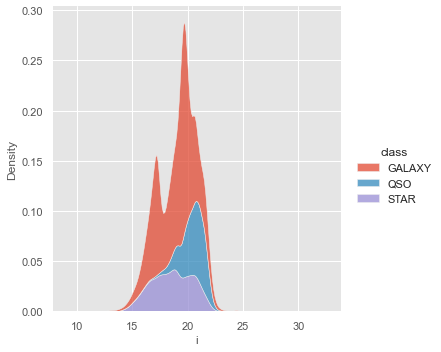

In [55]:
sns.displot(data=df, x='i', kind="kde", hue="class", multiple='stack')


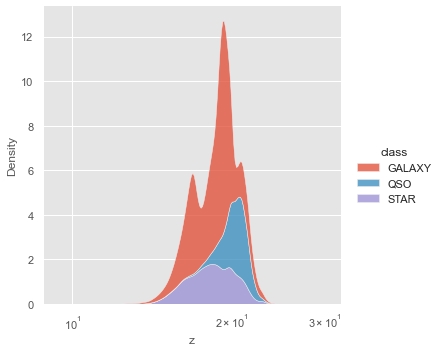

In [56]:
sns.displot(data=df, x='z', kind="kde", hue="class", log_scale=True, multiple='stack')


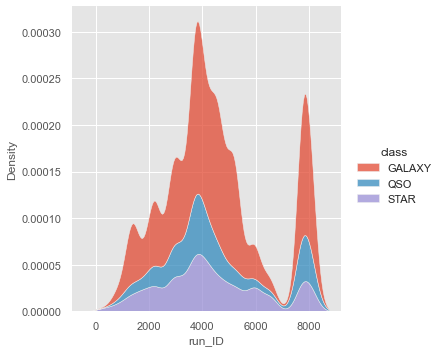

In [57]:
sns.displot(data=df, x='run_ID', kind="kde", hue="class", multiple='stack')


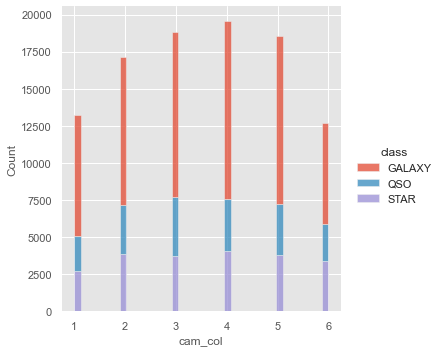

In [58]:
sns.displot(data=df, x='cam_col', kind="hist", hue="class", multiple="stack")


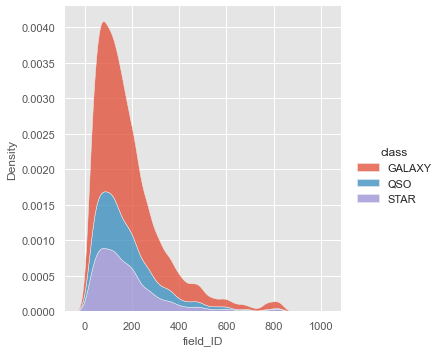

In [59]:
sns.displot(data=df, x='field_ID', kind="kde", hue="class", multiple='stack')


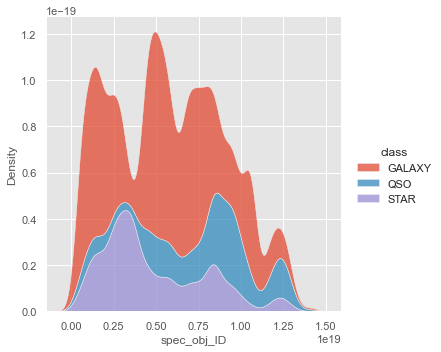

In [60]:
sns.displot(data=df, x='spec_obj_ID', kind="kde", hue="class", multiple='stack')


<AxesSubplot:xlabel='redshift', ylabel='Density'>

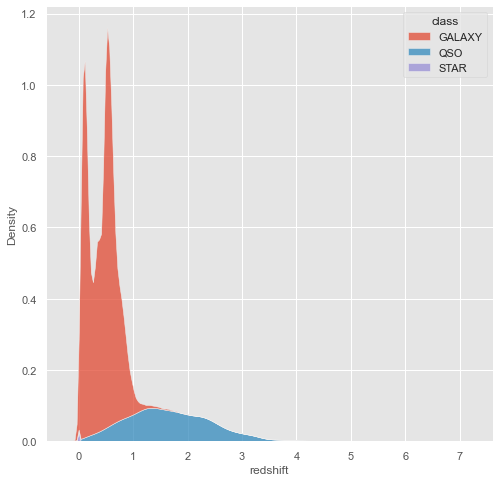

In [97]:
sns.kdeplot(data=df, x="redshift", hue="class", multiple="stack")

<AxesSubplot:xlabel='redshift', ylabel='Density'>

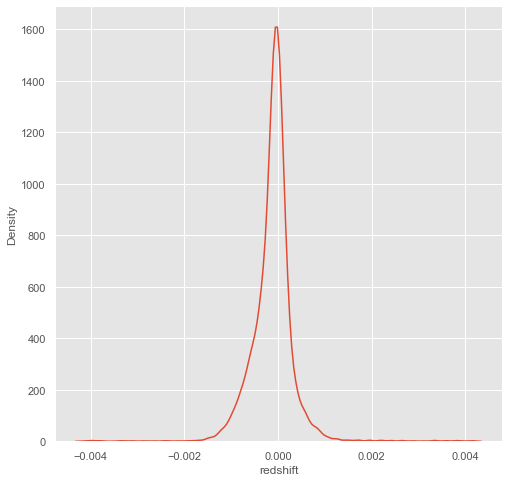

In [98]:
sns.kdeplot(data=df.loc[df['class'] == 'STAR'], x="redshift")

<AxesSubplot:xlabel='redshift', ylabel='Density'>

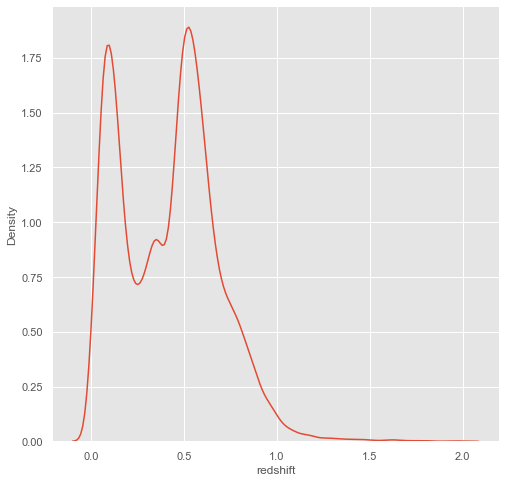

In [99]:
sns.kdeplot(data=df.loc[df['class'] == 'GALAXY'], x="redshift")

<AxesSubplot:xlabel='redshift', ylabel='Density'>

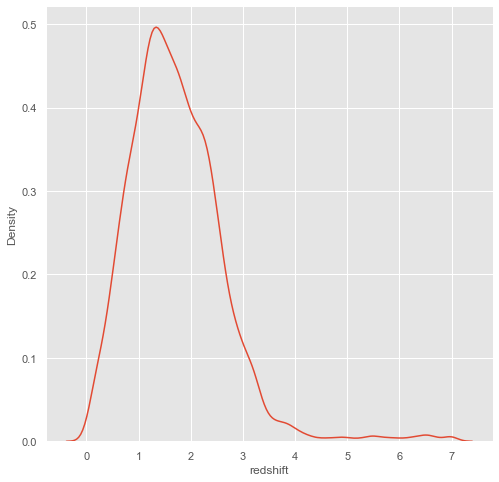

In [100]:
sns.kdeplot(data=df.loc[df['class'] == 'QSO'], x="redshift")

Na tym rozkładzie zauważam, że wartości `redshit` dla klasy `STAR` są położone zazwyczaj poniżej zera, natomiast `GALAXY` i `QSO` powyżej zera, z tym, że czasami wartości te na siebie dokładają i po samym rozkładzie `redshift` nie można rozróżnić klasy danej obserwacji, stąd później w macierzy pomyłek widać, że galaktyki są czasami mylone z kwazarami.

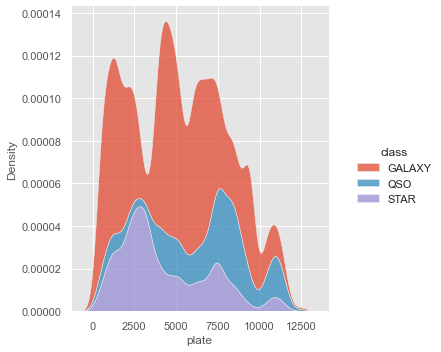

In [62]:
sns.displot(data=df, x='plate', kind="kde", hue="class", multiple='stack')


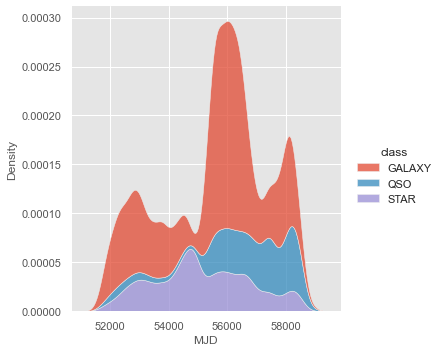

In [63]:
sns.displot(data=df, x='MJD', kind="kde", hue="class", multiple='stack')


Niestety nie udaje mi się zauważyć niczego charaktersytycznego dla poczególnej klasy na konkretnym atrybucie, za wyjątkiem jednej własności - `redshit`. Dla prawie każdego atrybutu zauważamy, że wartość gęstości poszczególnych atrybutów jest największa dla klasy `GALAXY` i zdecydowanie odstaje od pozostałych klas `QSO` oraz `STAR`, które mają podobne wartości gęstości i zazwyczaj wynoszą ponad dwa razy mniej od `GALAXY`. Stąd przypuszczam, że klasa `GALAXY` jest klasą większościową. Postanawiam to sprawdzić. Powyższa analiza nie pozwala mi odrzucić żadnego kryterium w dalszej analizie.


In [16]:
df['class'].value_counts()

GALAXY    59445
STAR      21594
QSO       18961
Name: class, dtype: int64

Klasy `GALAXY` jest $59.45\%$ wszystkich obserwacji 

Klasy `STAR` jest $21.69\%$ wszystkich obserwacji 

Klasy `QSO` jest $18.96\%$ wszystkich obserwacji 

Oznacza to, że klasa `GALAXY` jest klasą większościową i przy klasyfikacji najlepiej będą się sprawdzały klasyfikatory dla klas niezbalansowanych.

#### Analiza PCA

[1.0000000e+00 3.2965971e-31]
1.0


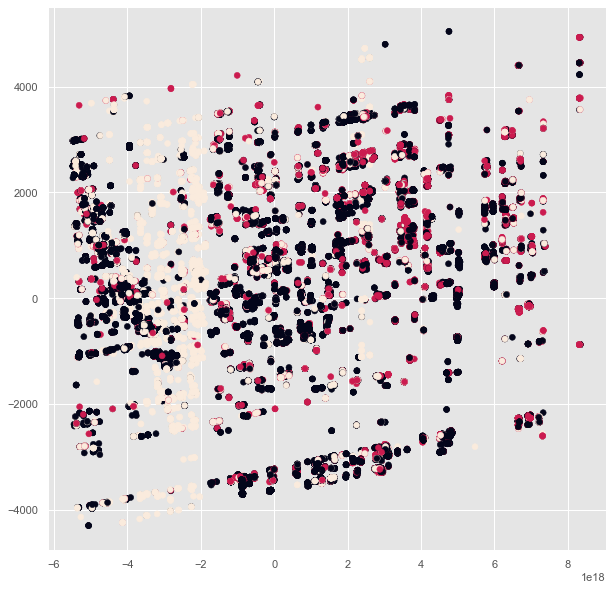

In [17]:
le = LabelEncoder()
df["class"] = le.fit_transform(df["class"])
df["class"] = df["class"].astype(int)

X = df.drop(columns='class').values
y = df['class'].values

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
print(pca.explained_variance_ratio_)
print(sum(pca.explained_variance_ratio_))
plt.figure(figsize=(10,10))
plt.scatter(*X_pca.T, c=y)

Po analizie dwuwymiarowej wizualizacji PCA trudno mi dobrać jakąś metodę klasyfikacji. Widzę, że dane nie są na pewno separowalne liniowe.

In [18]:
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)
print(pca.explained_variance_ratio_)

import plotly.express as px
fig = px.scatter_3d(X_pca, x=0, y=1, z=2, color=y)
fig.update_traces(marker=dict(size=2))
fig.show()

[1.00000000e+00 3.29659710e-31 1.72040537e-32]


Po analizie trzywymiarowej wizualizacji PCA również trudno mi dobrać jakąś metodę klasyfikacji. Obserwacje bardzo się na siebie nakładają i każda klasa przeplata się wzajemnie z drugą.

#### Analiza korelacji pomiędzy atrybutami

<AxesSubplot:>

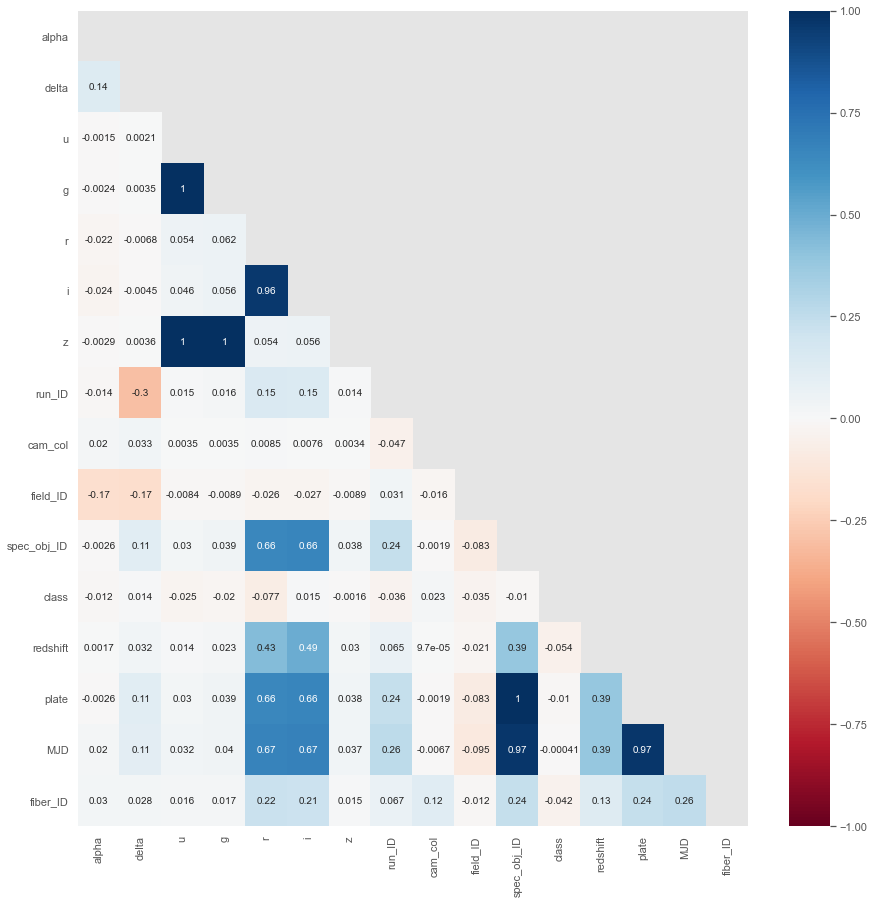

In [73]:
corr = df.corr()
sns.set(rc = {'figure.figsize':(15,15)})
sns.heatmap(corr, mask=np.triu(np.ones_like(corr)), annot=True, cmap='RdBu', vmin=-1, vmax=1)

Z macierzy korelacji możemy znaleźć wiele silnych korelacji:
- atrybut `u` z: 
    - `z` oraz `g` ma korelację wynoszącą, aż $1$,
- atrybut `g` z:
    - `z` ma korelację wynoszącą, aż $1$,
- atrybut `r` z:
    - `i` ma korelację wynoszącą $0.96$,
    - `MJD`, `plate` oraz `spec_obj_ID` ma korelację wynoszącą około $0.66$,
    - `redshift` ma korelację wynoszącą $0.43$,
- atrybut `i` z:
    - `MJD`, `plate` oraz `spec_obj_ID` ma korelację wynoszącą około $0.66$,
    - `redshift` ma korelację wynoszącą $0.49$,
- atrybut `spec_obj_ID` z:
    - `MJD`, `plate` ma korelację wynoszącą kolejno $0.97$ i $1$,
- atrybut `plate` z:
    - `MJD` ma korelację wynoszącą $0.97$.

Korelacje te są logiczne, ponieważ filtry ultrafioletowy, zielony i podczerwieni w układzie fotometrycznym wzajemnie się wykluczają, tak samo jak i filtr czerwony i bliskiej podczerwieni. MJD i plate wzajemnie się określają.

### Opis wybranych obserwacji

#### Obserwacja pierwsza

In [74]:
df.iloc[0]

alpha          1.356891e+02
delta          3.249463e+01
u              2.387882e+01
g              2.227530e+01
r              2.039501e+01
i              1.916573e+01
z              1.879371e+01
run_ID         3.606000e+03
cam_col        2.000000e+00
field_ID       7.900000e+01
spec_obj_ID    6.543777e+18
class          0.000000e+00
redshift       6.347936e-01
plate          5.812000e+03
MJD            5.635400e+04
fiber_ID       1.710000e+02
Name: 0, dtype: float64

Tutaj mamy obserwację, która jest galaktyką. Wartość `redshift` jest większa od zera to znaczy, że długość fali odbieranej jest większa od rzeczywistej. To znaczy, że jest to bardzo odległa galaktyka, ponieważ właśnie dla takich obserwuje się takie zjawisko.

#### Obserwacja szósta

In [22]:
df.iloc[6]

alpha          2.323493e+01
delta          1.141819e+01
u              2.146973e+01
g              2.117624e+01
r              2.092829e+01
i              2.060826e+01
z              2.042573e+01
run_ID         7.773000e+03
cam_col        2.000000e+00
field_ID       4.620000e+02
spec_obj_ID    1.246262e+19
class          1.000000e+00
redshift       5.864546e-01
plate          1.106900e+04
MJD            5.845600e+04
fiber_ID       1.130000e+02
Name: 6, dtype: float64

Tutaj mamy obserwację, która jest kwazarem. Wartość `redshift` jest tutaj również większa od zera. Oznacza to, że mam ponownie do czynienia z odległym obiektem od Ziemii.

#### Obserwacja dziewiąta

In [23]:
df.iloc[9]

alpha          3.914969e+01
delta          2.810284e+01
u              2.174669e+01
g              2.003493e+01
r              1.917553e+01
i              1.881823e+01
z              1.865422e+01
run_ID         5.934000e+03
cam_col        4.000000e+00
field_ID       1.220000e+02
spec_obj_ID    2.751763e+18
class          2.000000e+00
redshift      -7.895373e-06
plate          2.444000e+03
MJD            5.408200e+04
fiber_ID       2.320000e+02
Name: 9, dtype: float64

Tutaj mamy obserwację, która jest gwiazdą. Wartość `redshift` w przeciwieństwie do swoich poprzedników jest mniejsza od zera. Oznacza to, że mamy do czynienia z odwrotnym zjawiskiem do redshiftu, ponieważ fala dochodząca do Ziemii jest krótsza od jej wartości rzeczywistej.

## Klasyfikacja

Po obejrzeniu wizualizacji PCA zauważam, że nie da się odseparować obserwacji liniowo i mamy 3 klasy, co uniemożliwia klasyfikację binarną. Przetestowałam klasyfikatory `MLP, SVC, QDA, GaussianNB, DecissionTreeClassifier, RandomForrestClassifier, GradienBoostingClassifier` i postanowiłam wybrać te trzy ostatnie do dalszej analizy.

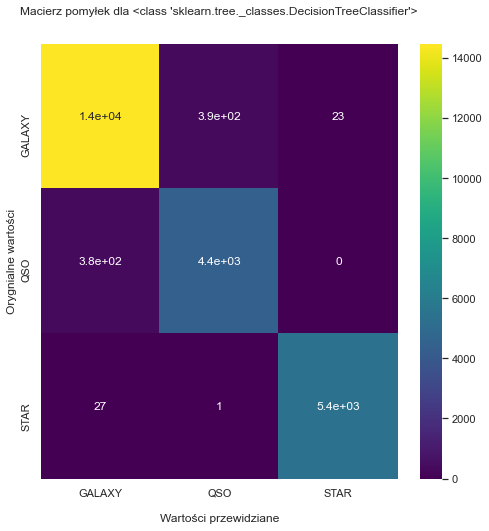

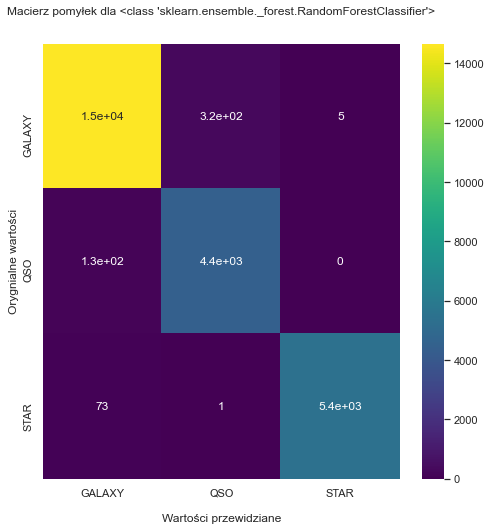

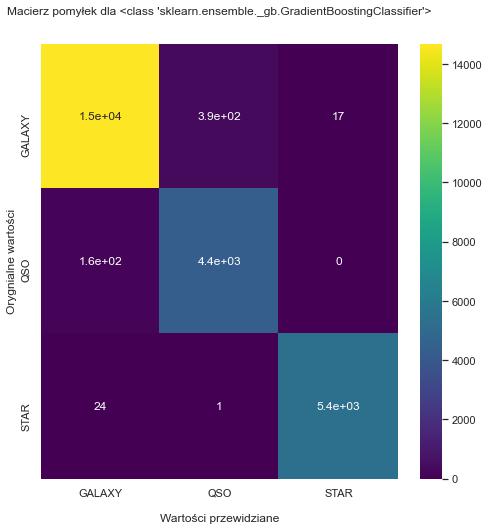

In [20]:
CLASSIFIERS = [DecisionTreeClassifier, RandomForestClassifier, GradientBoostingClassifier]
sns.set(rc = {'figure.figsize':(8,8)})

results = []
for c in CLASSIFIERS:
    for tr_i, te_i in fold.split(X, y):
        X_train, X_test = X[tr_i], X[te_i]
        y_train, y_test = y[tr_i], y[te_i]
        model = c()
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        y_score = model.predict_proba(X_test)

        results += [dict(name=c.__name__,
                     accuracy_score = accuracy_score(y_test, y_pred),
                     geometric_mean_score = geometric_mean_score(y_test, y_pred),
                     roc_auc_score = roc_auc_score(y_test, y_score, multi_class='ovo'))]

    cf_matrix = confusion_matrix(y_pred, y_test) 


    ax = sns.heatmap(cf_matrix, annot=True, cmap='viridis')

    ax.set_title(f'Macierz pomyłek dla {c}\n\n')
    ax.set_xlabel('\nWartości przewidziane')
    ax.set_ylabel('Orygnialne wartości')

    ax.xaxis.set_ticklabels(['GALAXY','QSO', 'STAR'])
    ax.yaxis.set_ticklabels(['GALAXY','QSO', 'STAR'])

    plt.show()

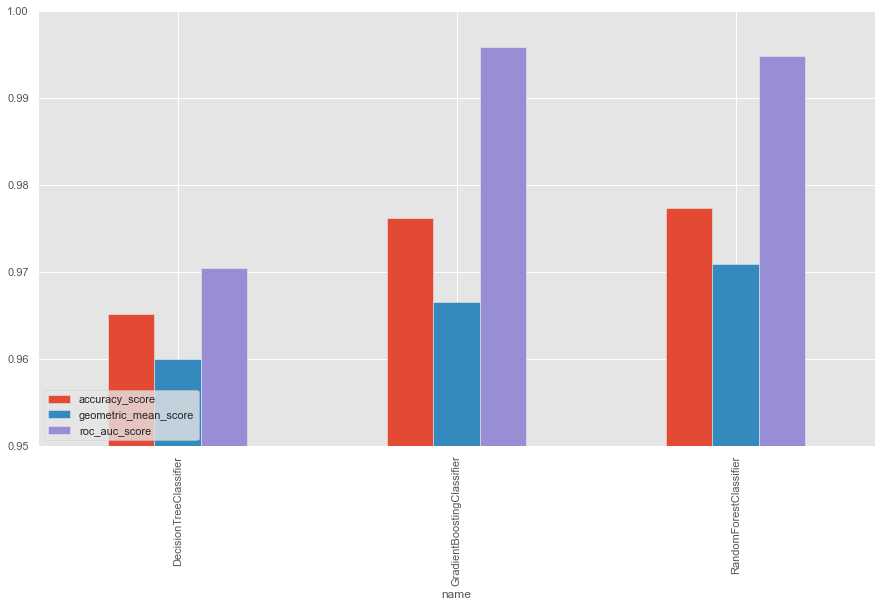

In [78]:
results = pd.DataFrame(results)
results

plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(15, 8))
results.groupby('name').mean().plot.bar(ax=ax)
plt.ylim(0.95,1)
plt.legend(loc='lower left')

Po analizie macierzy pomyłek i wykresów przedstawiających trzy miary zauważam, że jakość klasyfikacji, pomimo żadnego tuningu parametrów, jest bardzo wysoka. Jednakże najczęściej klasyfikatory mylą klasę `QSO z GALAXY`, więc postanawiam jeszcze poprawić wyniki. W dalszej klasyfikacji postanawiam sprawdzić ważność atrybutów i przy pomocy `GridSearchCV` znaleźć najlepsze parametry, które poprawią jakość klasyfikacji.

#### Decision Tree Classifier

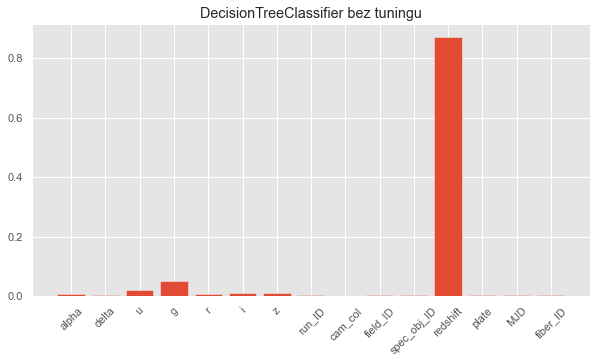

Jakość klasyfikacji DecisionTreeClassifier bez tuningu: 0.965


In [108]:
column_names = df.drop(columns='class').columns
model = DecisionTreeClassifier()
model.fit(X, y)
importance = model.feature_importances_ 
feature_importance = []
for i,v in enumerate(importance):
	feature_importance.append((column_names[i],v))

plt.figure(figsize=(10,5))
plt.bar([x for x in column_names], importance)
plt.xticks([x for x in column_names], column_names, rotation=45)
plt.title("DecisionTreeClassifier bez tuningu")
plt.show()
score = cross_val_score(model , X , y ,cv=fold)
print(f"Jakość klasyfikacji DecisionTreeClassifier bez tuningu: {np.mean(score)}")

In [6]:
Pipeline(steps=[('scaler', StandardScaler()),
                ('gridsearch',
                 GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=2021, shuffle=True),
                              estimator=DecisionTreeClassifier(),
                              param_grid={'class_weight': ['balanced', None],
                                          'criterion': ['gini', 'entropy'],
                                          'max_depth': [5, 10, 50, 100, 1000, None],
                                          'max_features': ['sqrt', 'log2', None],
                                          'min_samples_leaf': [1, 5, 10, 15, 20],
                                          'splitter': ['best', 'random']},
                              scoring=make_scorer(geometric_mean_score)))])

Pipeline(steps=[('scaler', StandardScaler()),
                ('gridsearch',
                 GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=2021, shuffle=True),
                              estimator=DecisionTreeClassifier(),
                              param_grid={'class_weight': ['balanced', None],
                                          'criterion': ['gini', 'entropy'],
                                          'max_depth': [5, 10, 50, 100, 1000,
                                                        None],
                                          'max_features': ['sqrt', 'log2',
                                                           None],
                                          'min_samples_leaf': [1, 5, 10, 15,
                                                               20],
                                          'splitter': ['best', 'random']},
                              scoring=make_scorer(geometric_mean_score)))])

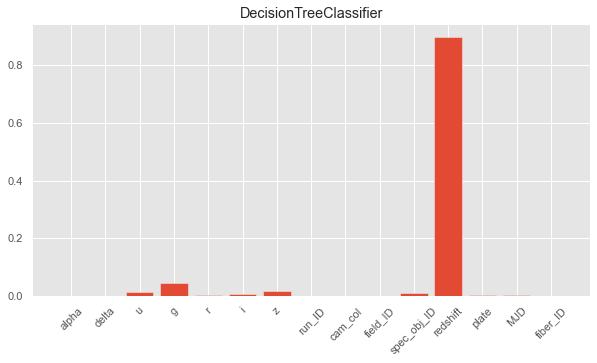

Jakość klasyfikacji DecisionTreeClassifier z tuningiem: 0.97052


In [103]:
column_names = df.drop(columns='class').columns
model = DecisionTreeClassifier(class_weight='balanced', criterion='entropy', max_depth=10, max_features=None, min_samples_leaf=10, splitter='best')
model.fit(X, y)
importance = model.feature_importances_ 
feature_importance = []
for i,v in enumerate(importance):
	feature_importance.append((column_names[i],v))

plt.figure(figsize=(10,5))
plt.bar([x for x in column_names], importance)
plt.xticks([x for x in column_names], column_names, rotation=45)
plt.title("DecisionTreeClassifier z tuningiem")
plt.show()
score = cross_val_score(model , X , y ,cv=fold)
print(f"Jakość klasyfikacji DecisionTreeClassifier z tuningiem: {np.mean(score)}")

Po wybraniu najlepszych parametrów trafność klasyfikacji wzrasta z $0.96488$ do $0.97052$, czyli o $0.564$ punktów procentowych. 
Z powodu, że mamy do czynienia ze zbiorem, gdzie klasy są nie zbalansowane dodaję parametr `class_weight='balanced'`, dodatkowo wybieram kryterium `criterion='entropy'`, które określa jakość podzielenia w drzewie, ograniczam również głębokość drzewa do `max_depth=10` i zwiększam liczbę próbek w liściu drzewa `min_samples_leaf=10`, `splitter='best'` pozostał taki jak w ustawieniach domyślnych.

#### Random Forrest Classifier

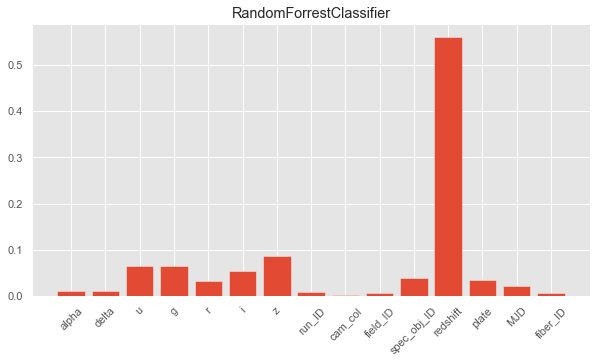

Jakość klasyfikacji RandomForestClassifier przed tuningiem: 0.9773499999999999


In [104]:
column_names = df.drop(columns='class').columns
model = RandomForestClassifier(n_jobs=8)
model.fit(X, y)
importance = model.feature_importances_ 
feature_importance = []
for i,v in enumerate(importance):
	feature_importance.append((column_names[i],v))

plt.figure(figsize=(10,5))
plt.bar([x for x in column_names], importance)
plt.xticks([x for x in column_names], column_names, rotation=45)
plt.title("RandomForrestClassifier bez tuningu")
plt.show()
score = cross_val_score(model , X , y ,cv=fold)
print(f"Jakość klasyfikacji RandomForestClassifier przed tuningiem: {np.mean(score)}")

In [7]:
Pipeline(steps=[('scaler', StandardScaler()),
                ('gridsearch',
                 GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=2021, shuffle=True),
                              estimator=RandomForestClassifier(n_jobs=8),
                              param_grid={'criterion': ['gini', 'entropy'],
                                          'max_features': ['sqrt', None],
                                          'n_estimators': [50, 100, 300, 500, 1000]},
                              scoring=make_scorer(geometric_mean_score)))])

Pipeline(steps=[('scaler', StandardScaler()),
                ('gridsearch',
                 GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=2021, shuffle=True),
                              estimator=RandomForestClassifier(n_jobs=8),
                              param_grid={'criterion': ['gini', 'entropy'],
                                          'max_features': ['sqrt', None],
                                          'n_estimators': [50, 100, 300, 500,
                                                           1000]},
                              scoring=make_scorer(geometric_mean_score)))])

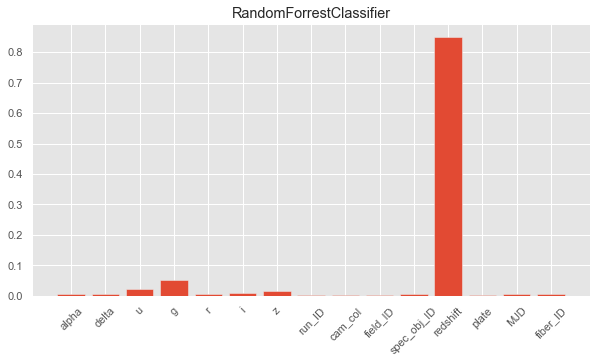

Jakość klasyfikacji RandomForestClassifier po tuningu: 0.97938


In [106]:
column_names = df.drop(columns='class').columns
model = RandomForestClassifier(n_jobs=8, criterion='entropy', max_features=None, n_estimators=1000)
model.fit(X, y)
importance = model.feature_importances_ 
feature_importance = []
for i,v in enumerate(importance):
	feature_importance.append((column_names[i],v))

plt.figure(figsize=(10,5))
plt.bar([x for x in column_names], importance)
plt.xticks([x for x in column_names], column_names, rotation=45)
plt.title("RandomForrestClassifier z tuningiem")
plt.show()
score = cross_val_score(model , X , y ,cv=fold)
print(f"Jakość klasyfikacji RandomForestClassifier po tuningu: {np.mean(score)}")

Po wybraniu najlepszych parametrów trafność klasyfikacji wzrasta z $0.97735$ do $0.97938$, czyli o $0.203$ punktów procentowych.

Dla lepszego działania klasyfikatora zwiększam parametr dziesięciokrotnie `n_estimators=1000`, dodatkowo zmieniam kryterium oceny jakości podziału `criterion='entropy'`, a `max_features=None` zmieniam ze `sqrt` na `None`, aby zwiększyć jakość podziału.

#### Gradient Boosting Classifier

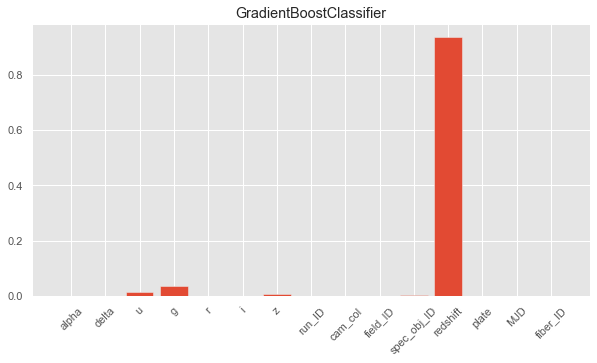

Jakość klasyfikacji GradientBoosting przed tuningiem: 0.97619


In [107]:
column_names = df.drop(columns='class').columns
model = GradientBoostingClassifier()
model.fit(X, y)
importance = model.feature_importances_ 
feature_importance = []
for i,v in enumerate(importance):
	feature_importance.append((column_names[i],v))

plt.figure(figsize=(10,5))
plt.bar([x for x in column_names], importance)
plt.xticks([x for x in column_names], column_names, rotation=45)
plt.title("GradientBoostClassifier bez tuningu")
plt.show()
score = cross_val_score(model , X , y ,cv=fold)
print(f"Jakość klasyfikacji GradientBoosting bez tuningu: {np.mean(score)}")


In [8]:
Pipeline(steps=[('scaler', StandardScaler()),
                ('gridsearch',
                 GridSearchCV(cv=StratifiedKFold(n_splits=4, random_state=62, shuffle=True),
                              estimator=GradientBoostingClassifier(),
                              param_grid={'learning_rate': [0.1, 0.05, 0.01],
                                          'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
                                          'max_features': ['sqrt', 'log2'],
                                          'min_samples_leaf': [1, 5, 10, 15, 20]},
                              scoring=make_scorer(geometric_mean_score)))])

Pipeline(steps=[('scaler', StandardScaler()),
                ('gridsearch',
                 GridSearchCV(cv=StratifiedKFold(n_splits=4, random_state=62, shuffle=True),
                              estimator=GradientBoostingClassifier(),
                              param_grid={'learning_rate': [0.1, 0.05, 0.01],
                                          'max_depth': [3, 4, 5, 6, 7, 8, 9,
                                                        10],
                                          'max_features': ['sqrt', 'log2'],
                                          'min_samples_leaf': [1, 5, 10, 15,
                                                               20]},
                              scoring=make_scorer(geometric_mean_score)))])

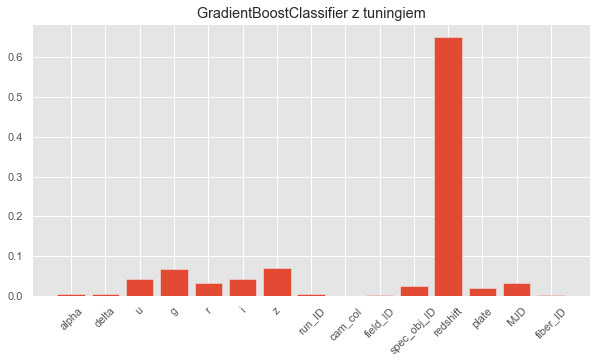

In [110]:
column_names = df.drop(columns='class').columns
model = GradientBoostingClassifier(learning_rate=0.1, max_depth=9, max_features='log2', min_samples_leaf=15)
model.fit(X, y)
importance = model.feature_importances_ 
feature_importance = []
for i,v in enumerate(importance):
	feature_importance.append((column_names[i],v))

plt.figure(figsize=(10,5))
plt.bar([x for x in column_names], importance)
plt.xticks([x for x in column_names], column_names, rotation=45)
plt.title("GradientBoostClassifier z tuningiem")
plt.show()
score = cross_val_score(model , X , y ,cv=fold)
print(f"Jakość klasyfikacji GradientBoosting z tuningiem: {np.mean(score)}")

Po wybraniu najlepszych parametrów trafność klasyfikacji wzrasta z $0.97619$ do $0.97906$, czyli o $0.287$ punktów procentowych.

Jako parametr `learning rate` zostawiam taki jak był ustawiony domyślnie w klasyfikatorze, zwiększam jednak `głębokość drzewa z 3 do 9`, co pozwoliło na lepszą klasyfikację, oraz zmieniam `max_features z None na log2`, dodatkowo zwiększam liczbę próbek w liściu drzewa `min_samples_leaf=10` z 1 do 10.

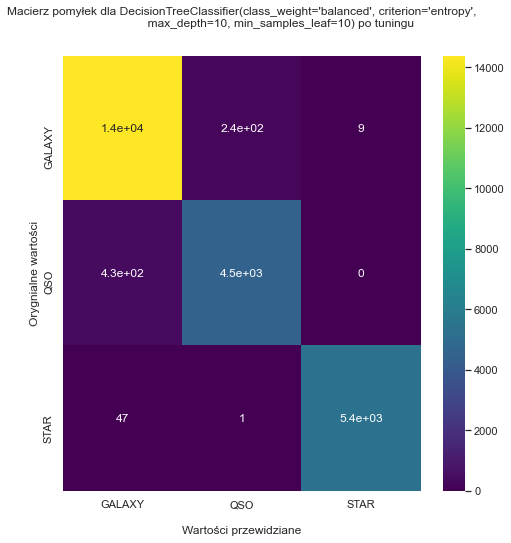

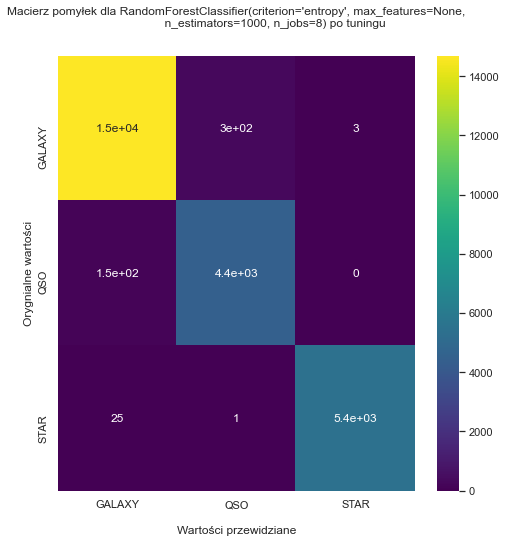

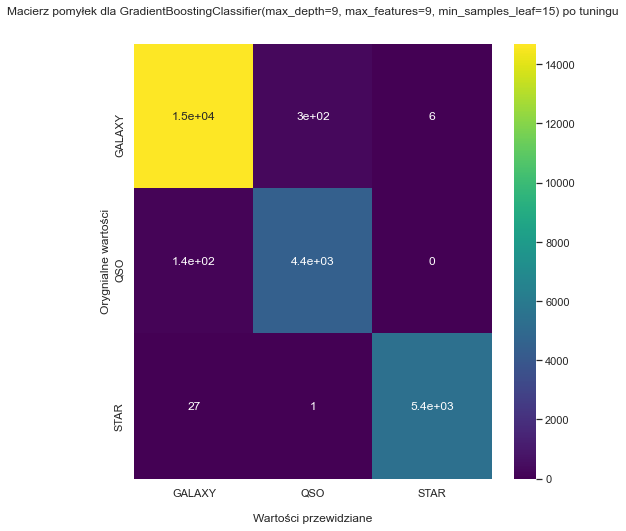

In [21]:
CLASSIFIERS = [
        DecisionTreeClassifier(class_weight='balanced', criterion='entropy', max_depth=10, max_features=None, min_samples_leaf=10, splitter='best') ,
        RandomForestClassifier(n_jobs=8, criterion='entropy', max_features=None, n_estimators=1000),
        GradientBoostingClassifier(learning_rate=0.1, max_depth=9, max_features='log2', min_samples_leaf=15)
        ]

CLASSES = [DecisionTreeClassifier, RandomForestClassifier, GradientBoostingClassifier]

sns.set(rc = {'figure.figsize':(8,8)})

results = []
for idx, c in enumerate(CLASSIFIERS):
    for tr_i, te_i in fold.split(X, y):
        X_train, X_test = X[tr_i], X[te_i]
        y_train, y_test = y[tr_i], y[te_i]
        model = c
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        y_score = model.predict_proba(X_test)

        results += [dict(name=CLASSES[idx].__name__,
                     accuracy_score = accuracy_score(y_test, y_pred),
                     geometric_mean_score = geometric_mean_score(y_test, y_pred),
                     roc_auc_score = roc_auc_score(y_test, y_score, multi_class='ovo'))]

    cf_matrix = confusion_matrix(y_pred, y_test) 


    ax = sns.heatmap(cf_matrix, annot=True, cmap='viridis')

    ax.set_title(f'Macierz pomyłek dla {c} po tuningu\n\n')
    ax.set_xlabel('\nWartości przewidziane')
    ax.set_ylabel('Orygnialne wartości')

    ax.xaxis.set_ticklabels(['GALAXY','QSO', 'STAR'])
    ax.yaxis.set_ticklabels(['GALAXY','QSO', 'STAR'])

    plt.show()

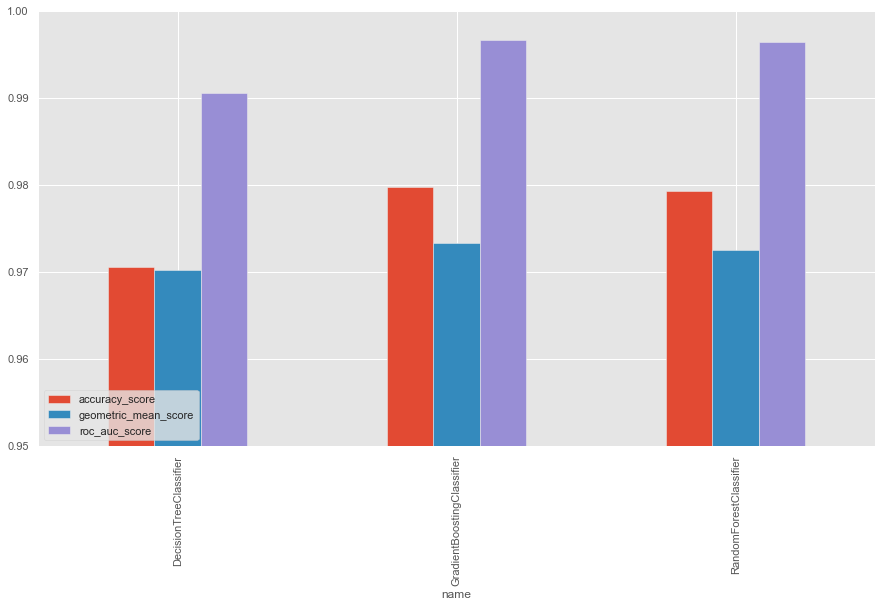

In [111]:
results = pd.DataFrame(results)
results

plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(15, 8))
results.groupby('name').mean().plot.bar(ax=ax)
plt.ylim(0.95,1)
plt.legend(loc='lower left')

## Wnioski

Z pośród trzech wybranych przez mnie klasyfikatorów najlepszą trafność klasyfikacji ma GradienBoostingClassifier $97.963\%$. Oznacza to, że na 100 000 obserwacji mój klasyfikator myli się tylko w 2037 przypadkach. Jest to około $2\%$ wszystkich danych. Oznacza to, że analiza ciał niebieskich na podstawie, przede wszystkim, atrybutu `redshift` oraz kilku mniej istotnych, jak różne rodzaje filtrów, pozwala z dużą dokładnością klasyfikować gwiazdy, kwazary i galaktyki. Najlepiej sprawdzają się do tego klasyfikatory oparte na drzewach, szczególnie te, które są przystosowane do klasyfikacji klas niezbalansowanych. 

Ogromnym utrudnieniem działania na tym zbiorze była bardzo duża liczba obserwacji, co znacznie wydłużało czas klasyfikacji i obciążało procesor komputera. Dodatkowo brak obszernej wiedzy na temat astronomii powodował brak możliwości dogłębnej analizy parametrów bez odpowiedniego researchu i zrozumienia zagadnień. Niestety nie wszystkie cechy, nawet po uzupełnieniu elementarnej wiedzy z astronomii, były dla mnie łatwe w rozszyfrowaniu. Uniemożliwiało mi to napisanie obszernych wniosków. Konkluzja z tego jest taka, że podczas pracy nad danym zbiorem danych, potrzebni są eksperci dziedzinowi, którzy pomogą informatykowi w lepszej analizie danych.